# Import dataset

In [1]:
import math
import numpy as np
import pandas as pd
import scipy
import scipy.stats as stats

import matplotlib.pyplot as plt
import plotly
import plotly.subplots
import plotly.express as px
import seaborn as sns
import sweetviz as sv

In [2]:
df = pd.read_csv('data/train.csv').set_index('id')
df['loan_percent_rate'] = df['loan_int_rate'] / 100
df.info(verbose=True)

<class 'pandas.core.frame.DataFrame'>
Index: 58645 entries, 0 to 58644
Data columns (total 13 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   person_age                  58645 non-null  int64  
 1   person_income               58645 non-null  int64  
 2   person_home_ownership       58645 non-null  object 
 3   person_emp_length           58645 non-null  float64
 4   loan_intent                 58645 non-null  object 
 5   loan_grade                  58645 non-null  object 
 6   loan_amnt                   58645 non-null  int64  
 7   loan_int_rate               58645 non-null  float64
 8   loan_percent_income         58645 non-null  float64
 9   cb_person_default_on_file   58645 non-null  object 
 10  cb_person_cred_hist_length  58645 non-null  int64  
 11  loan_status                 58645 non-null  int64  
 12  loan_percent_rate           58645 non-null  float64
dtypes: float64(4), int64(5), object(4)
m

In [3]:
df

,person_age,person_income,person_home_ownership,person_emp_length,loan_intent,loan_grade,loan_amnt,loan_int_rate,loan_percent_income,cb_person_default_on_file,cb_person_cred_hist_length,loan_status,loan_percent_rate
id,,,,,,,,,,,,,
0,37,35000,RENT,0.0,EDUCATION,B,6000,11.49,0.17,N,14,0,0.1149
1,22,56000,OWN,6.0,MEDICAL,C,4000,13.35,0.07,N,2,0,0.1335
2,29,28800,OWN,8.0,PERSONAL,A,6000,8.90,0.21,N,10,0,0.0890
3,30,70000,RENT,14.0,VENTURE,B,12000,11.11,0.17,N,5,0,0.1111
4,22,60000,RENT,2.0,MEDICAL,A,6000,6.92,0.10,N,3,0,0.0692
...,...,...,...,...,...,...,...,...,...,...,...,...,...
58640,34,120000,MORTGAGE,5.0,EDUCATION,D,25000,15.95,0.21,Y,10,0,0.1595
58641,28,28800,RENT,0.0,MEDICAL,C,10000,12.73,0.35,N,8,1,0.1273
58642,23,44000,RENT,7.0,EDUCATION,D,6800,16.00,0.15,N,2,1,0.1600


In [4]:
sv.analyze(df).show_html()

                                             |          | [  0%]   00:00 -> (? left)

Report SWEETVIZ_REPORT.html was generated! NOTEBOOK/COLAB USERS: the web browser MAY not pop up, regardless, the report IS saved in your notebook/colab files.


# person_age                  (int64)  


In [5]:
px.histogram(
    df, 
    x = 'person_age', 
    range_x = (10, 100),
    marginal = 'box',
    histnorm = 'probability'
)

# person_income               (int64)  


In [6]:
px.histogram(
    df, 
    x = 'person_income', 
    nbins = 1000,
    log_x = True,
    marginal = 'box'
)

## Normality test on `log(person_income)`

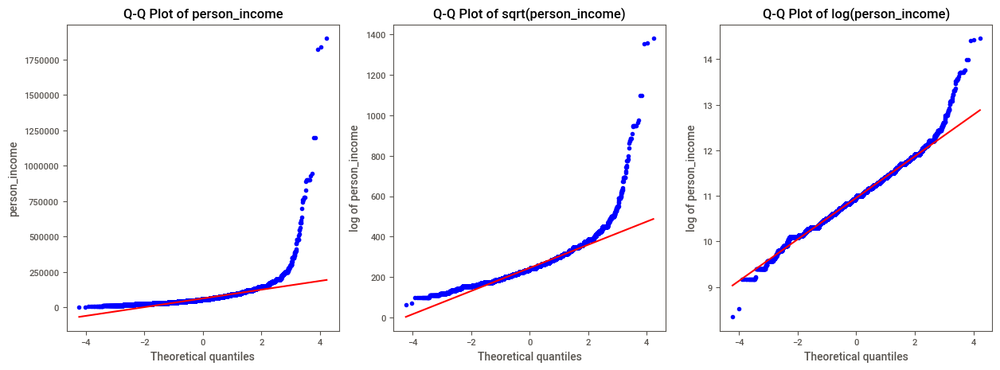

In [7]:
fig, axs = plt.subplots(1, 3, figsize = (15, 5))

df['person_income'] \
    .pipe(lambda _: stats.probplot(_, dist="norm", plot=axs[0]))

df['person_income'] \
    .apply(math.sqrt) \
    .pipe(lambda _: stats.probplot(_, dist="norm", plot=axs[1]))

df['person_income'] \
    .apply(math.log) \
    .pipe(lambda _: stats.probplot(_, dist="norm", plot=axs[2]))

axs[0].set_ylabel('person_income')
axs[0].set_title('Q-Q Plot of {}'.format('person_income'))

axs[1].set_ylabel('log of person_income')
axs[1].set_title('Q-Q Plot of {}'.format('sqrt(person_income)'))

axs[2].set_ylabel('log of person_income')
axs[2].set_title('Q-Q Plot of {}'.format('log(person_income)'))

plt.show()

# person_home_ownership       (object) 


In [8]:
df_person_home_ownership = df['person_home_ownership'] \
    .value_counts() \
    .loc[['OWN', 'MORTGAGE', 'RENT', 'OTHER']] \
    .to_frame() \
    .reset_index()

df_person_home_ownership

px.bar(
    df_person_home_ownership,
    x = 'person_home_ownership',
    y = 'count',
    width = 640
)

# person_emp_length           (int, discrete)


In [9]:
df_person_emp_length_0 = df['person_emp_length'] \
    .apply(lambda x: x)

px.histogram(
    df_person_emp_length_0,
    marginal = 'box'
)

# loan_intent                 (object) 


In [10]:
px.histogram(
    df,
    x = 'loan_intent',
    width = 720
) \
    .update_xaxes(categoryorder = 'total descending')

# loan_grade                  (object) 


In [11]:
px.histogram(
    df,
    x = 'loan_grade',
    width = 720
) \
    .update_xaxes(categoryorder = 'total descending')

# loan_amnt                   (int64)  


In [12]:
px.histogram(
    df.loc[:, 'loan_amnt'].apply(math.sqrt),
    nbins = 50,
    marginal = 'box'
)

## Normality test on `loan_amnt`

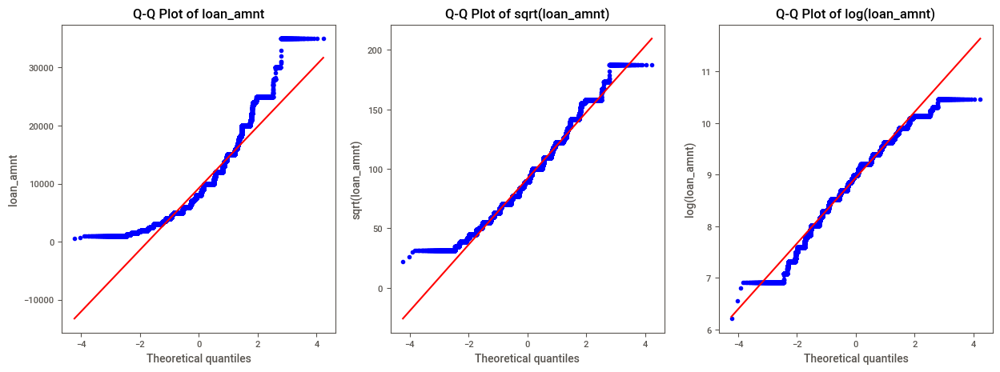

In [13]:
# QQ-plots of a variable and its transformation

var_name = 'loan_amnt'

test_fns = [
    (lambda x: x,                  '{}'.format(var_name)),
    (lambda x: math.sqrt(x), 'sqrt({})'.format(var_name)),
    (lambda x: math.log(x),   'log({})'.format(var_name))
]

fig, axs = plt.subplots(1, 3, figsize = (15, 5))

for ax, (fn, lab) in zip(axs, test_fns):
    df[var_name] \
        .apply(fn) \
        .pipe(lambda _: stats.probplot(_, dist="norm", plot=ax))

    ax.set_ylabel(lab)
    ax.set_title('Q-Q Plot of {}'.format(lab))

plt.show()

# loan_precent_rate               (float64)


In [14]:
px.histogram(
    df,
    x = 'loan_percent_rate',
    marginal = 'box'
)

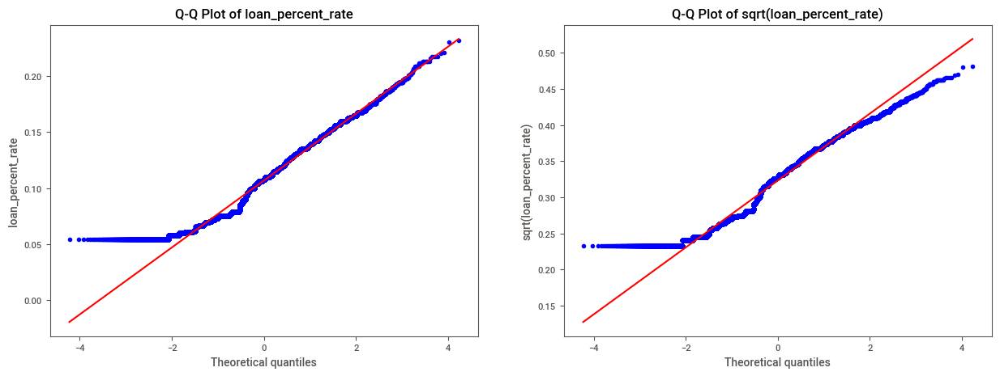

In [15]:
# QQ-plots of a variable and its transformation

var_name = 'loan_percent_rate'

test_fns = [
    (lambda x: x,                  '{}'.format(var_name)),
    (lambda x: math.sqrt(x), 'sqrt({})'.format(var_name))
]

fig, axs = plt.subplots(1, 2, figsize = (15, 5))

for ax, (fn, lab) in zip(axs, test_fns):
    df[var_name] \
        .apply(fn) \
        .pipe(lambda _: stats.probplot(_, dist="norm", plot=ax))

    ax.set_ylabel(lab)
    ax.set_title('Q-Q Plot of {}'.format(lab))

plt.show()

# loan_percent_income         (float64)


In [16]:
px.histogram(
    df,
    x = 'loan_percent_income',
    marginal = 'box'
)

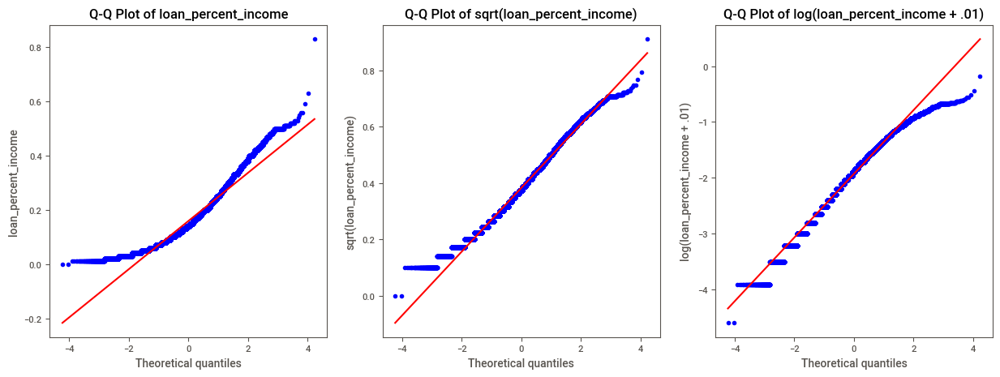

In [17]:
# QQ-plots of a variable and its transformation

var_name = 'loan_percent_income'

test_fns = [
    (lambda x: x,                            '{}'.format(var_name)),
    (lambda x: math.sqrt(x),           'sqrt({})'.format(var_name)),
    (lambda x: math.log(x + .01), 'log({} + .01)'.format(var_name))
]

fig, axs = plt.subplots(1, 3, figsize = (15, 5))

for ax, (fn, lab) in zip(axs, test_fns):
    df[var_name] \
        .apply(fn) \
        .pipe(lambda _: stats.probplot(_, dist="norm", plot=ax))

    ax.set_ylabel(lab)
    ax.set_title('Q-Q Plot of {}'.format(lab))

plt.show()

# cb_person_default_on_file   (object) 


In [18]:
df['cb_person_default_on_file'] \
    .value_counts()

cb_person_default_on_file
N    49943
Y     8702
Name: count, dtype: int64

# cb_person_cred_hist_length  (int64)  


In [19]:
px.histogram(
    df,
    x = 'cb_person_cred_hist_length'
)

# loan_status                 (int64) 

In [20]:
df['loan_status'] \
    .value_counts()

loan_status
0    50295
1     8350
Name: count, dtype: int64